# Stacked Machine Learning

In [2]:
## IMPORTANT !

# In the first order need to set the number of CPU 
# for calculation before launching (depends on computer's number of cores)
n_jobs= 30

### Load libraries

In [3]:
#libraries
import pandas as pd
import numpy as np
import os
import sys
import shutil
import glob
import joblib
import warnings
from datetime import date, datetime

from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import GroupKFold
from sklearn.model_selection import LeavePGroupsOut
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import pearsonr
import scipy.stats as st

from nilearn import image as nli
from nilearn import plotting

#from mne.viz import plot_connectivity_circle
from mne_connectivity.viz import plot_connectivity_circle

import matplotlib.patches as mpatches

### Load tables

##### load indexes for next tables

In [4]:
path='/media/DataD800/Alina/main_set/MLtables/'

In [5]:
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

#demography
demo = pd.read_csv(path+'demographics_table_new.csv', index_col=0)

#targets table
targ = pd.read_csv(path+'cognition_table.csv', index_col=0)


In [6]:
rest_index = pd.read_csv('/media/data/HCPAging/data/MLTablesMultCon/rest.csv', index_col=0).columns
task_index = pd.read_csv(path+'emo_table.csv', index_col=0).columns
surf_index = pd.read_csv(path+'cort_table.csv', index_col=0).columns
subc_index = pd.read_csv(path+'subc_table.csv', index_col=0).columns
vol_index = pd.read_csv(path+'VolBrain_table.csv', index_col=0).columns

In [7]:
lblY1 = ['Working Memory Task',
'Language Task',
'Resting-State FC 75PC',
'Relational Task',
'Motor Task',
'Emotional Task',
'Social Task',
'Surface Area',    
'Total Brain Volume',
'Subcortical Volume',        
'Cortical Thickness',            
'Gambling Task']

lblY2 = ['Working Memory Task',
'Language Task',
'Relational Task',
'Motor Task',
'Emotional Task',
'Social Task',           
'Gambling Task']

lblY3 = ['Resting-State FC 75PC',
'Surface Area',    
'Total Brain Volume',
'Subcortical Volume',        
'Cortical Thickness']

lblY4 = ['Working Memory Task',
'Language Task',
'Relational Task']


##### Load main tables 

##### path

In [ ]:
#path to folders with ML prepared tables
path_tab_sp = '/media/DataD800/Alina/main_set/MLtables/output_mainset_CogTotalComp_Unadj_norace_pca75_NoRestMov/'
#print(sorted(os.listdir(path_tab_sp)))

In [9]:
#path to folder with results
path_tab_res = '/media/hcs-psy-narun/Alina_results/Alina3/ML_ready_tables_residuals_folds/'

In [10]:
path_out = '/media/hcs-psy-narun/Alina_results/Alina3/mainset_outputs/'

#### load results table

In [11]:
#load results
dct_results={}
for i in sorted(glob.glob(path_tab_res+'coef_*')):
    dct_results[i.split('/')[-1].split('.')[0].split('_')[1]] = pd.read_csv(i, index_col=0).T

In [12]:
#load pca models for each fold
folds = sorted(os.listdir(path_tab_sp))[:8]
dct_pca_model={}
for fold in folds:
    dct_pca_model[fold] = pd.DataFrame(joblib.load(path_tab_sp+fold+'/rest_pca_model.sav').components_, columns=rest_index)

In [13]:
dct_results.keys()

dict_keys(['VolBrain', 'all', 'cort', 'emo', 'gam', 'lan', 'mot', 'non-task', 'rel', 'rest-pca75', 'soc', 'subc', 'surf', 'task', 'top-task', 'wm'])

In [14]:
#index_for tables
#change indexing 
for key in dct_results.keys():
    if key in ['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm']:
        dct_results[key].columns = task_index
    if key in ['cort', 'surf']:
        dct_results[key].columns = surf_index
    if key in ['subc']:
        dct_results[key].columns = subc_index
    if key in ['VolBrain']:
        dct_results[key].columns = vol_index
    if key in ['all']:
        dct_results[key].columns = lblY1
    if key in ['task']:
        dct_results[key].columns = lblY2
    if key in ['non-task']:
        dct_results[key].columns = lblY3
    if key in ['top-task']:
        dct_results[key].columns = lblY4


In [15]:
#['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm']
#['cort', 'surf']
#['subc']
#['VolBrain']
#['rest']
#['all', 'task', 'top-task', 'non-task']

In [16]:
for key in dct_results.keys():
    print(key)
    display(dct_results[key])

VolBrain


,FS_IntraCranial_Vol,FS_TotCort_GM_Vol,FS_SubCort_GM_Vol,FS_Tot_WM_Vol,FS_BrainSegVol_eTIV_Ratio
Fold_0,1.619134,0.982249,-0.000000,0.000000,-0.139830
Fold_1,0.987472,1.604239,-0.000000,0.000000,-0.000000
Fold_2,1.316895,1.555152,-0.000000,-0.000000,-0.442839
Fold_3,2.009450,3.077396,-1.716578,-0.946714,0.747759
Fold_4,0.925593,1.205240,-0.000000,-0.000000,-0.483123
Fold_5,3.884375,2.661704,-1.170130,-2.228395,1.276441
Fold_6,1.093965,1.629961,-0.981922,0.002332,0.106121
Fold_7,6.427737,0.000000,-1.473358,-2.367325,2.670788


all


,Working Memory Task,Language Task,Resting-State FC 75PC,Relational Task,Motor Task,Emotional Task,Social Task,Surface Area,Total Brain Volume,Subcortical Volume,Cortical Thickness,Gambling Task
Fold_0,0.729784,0.361881,0.414066,0.349201,0.120405,0.548948,0.139558,0.175642,0.367758,0.503037,0.155585,5.261375e-47
Fold_1,0.491225,0.839003,0.601124,0.265385,0.335624,0.526745,0.277339,0.293338,0.207179,-0.015578,0.152720,1.840882e-02
Fold_2,0.374002,0.576060,0.540646,0.811402,0.282025,0.406284,0.072615,0.389572,0.196860,-0.004366,0.187463,0.000000e+00
Fold_3,0.848788,0.382181,0.206259,0.600471,0.412069,0.493550,0.346566,0.358994,0.235101,0.223025,0.258502,-7.293842e-02
Fold_4,0.836202,0.469010,0.358412,0.602568,0.179574,0.338639,-0.029818,0.574182,0.405481,0.177647,0.228252,0.000000e+00
Fold_5,0.799210,0.538821,0.238771,0.366147,0.353207,0.432156,0.150702,0.210923,0.137643,-0.039725,0.216581,2.246616e-03
Fold_6,0.712527,0.300088,0.274076,0.368133,0.257544,0.369834,0.063262,0.523049,0.272086,0.242758,0.221946,0.000000e+00
Fold_7,0.630514,0.387816,0.187828,0.452050,0.615871,0.356740,0.204600,0.333140,0.505103,0.166274,0.061491,0.000000e+00


cort


,lh_G_and_S_frontomargin,lh_G_and_S_occipital_inf,lh_G_and_S_paracentral,lh_G_and_S_subcentral,lh_G_and_S_transv_frontopol,lh_G_and_S_cingul-Ant,lh_G_and_S_cingul-Mid-Ant,lh_G_and_S_cingul-Mid-Post,lh_G_cingul-Post-dorsal,lh_G_cingul-Post-ventral,...,rh_S_parieto_occipital,rh_S_pericallosal,rh_S_postcentral,rh_S_precentral-inf-part,rh_S_precentral-sup-part,rh_S_suborbital,rh_S_subparietal,rh_S_temporal_inf,rh_S_temporal_sup,rh_S_temporal_transverse
Fold_0,-0.001355,0.025942,0.080910,0.027033,-0.059947,-0.113903,-0.072087,-0.051872,0.003045,-0.068125,...,0.045963,-0.024581,-0.016369,0.030956,-0.020668,-0.004515,0.032891,0.021638,0.011422,0.001488
Fold_1,-0.047579,0.081607,0.051385,-0.000000,-0.242061,-0.052503,-0.000006,-0.019141,0.000000,0.002760,...,0.209870,0.117574,-0.016870,-0.000000,0.000000,-0.120726,0.030083,-0.014115,-0.000000,0.000000
Fold_2,-0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.092049,-0.000000,-0.000000,0.000000,-0.000000,...,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000
Fold_3,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.062867,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000
Fold_4,-0.012190,0.039454,0.112909,0.007141,-0.130530,-0.073849,-0.147938,-0.131594,0.018280,-0.022268,...,0.076152,0.031586,-0.057551,0.017354,-0.047131,-0.111058,-0.015746,-0.031518,-0.046067,0.027810
Fold_5,-0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.074027,-0.000000,-0.000000,0.000000,0.000000,...,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
Fold_6,0.014595,0.088135,-0.036303,-0.006998,-0.043781,-0.035416,-0.027417,-0.015642,-0.021383,-0.005617,...,0.112886,0.066985,-0.026364,0.041466,0.015918,0.030810,0.092658,-0.012407,-0.011552,0.041626
Fold_7,-0.079109,0.044316,0.100148,0.115635,-0.081990,-0.137104,-0.175118,-0.175828,0.180123,-0.029469,...,0.248047,0.010278,-0.072994,-0.040372,-0.004599,-0.154515,0.068808,-0.011620,-0.039450,0.188758


emo


,R_V1_ROI,R_MST_ROI,R_V6_ROI,R_V2_ROI,R_V3_ROI,R_V4_ROI,R_V8_ROI,R_4_ROI,R_3b_ROI,R_FEF_ROI,...,DIENCEPHALON_VENTRAL_LEFT,DIENCEPHALON_VENTRAL_RIGHT,HIPPOCAMPUS_LEFT,HIPPOCAMPUS_RIGHT,PALLIDUM_LEFT,PALLIDUM_RIGHT,PUTAMEN_LEFT,PUTAMEN_RIGHT,THALAMUS_LEFT,THALAMUS_RIGHT
Fold_0,0.152459,-0.051369,0.116285,0.103235,0.070237,0.159142,-0.015132,0.006627,-0.013469,0.079849,...,0.205579,0.130347,0.057171,0.038854,0.017570,-0.087388,0.068422,0.013001,-0.069818,-0.010802
Fold_1,0.206206,-0.000000,0.144322,0.166826,0.128957,0.287136,0.020856,-0.000000,-0.000000,0.009606,...,0.122868,0.077146,0.000000,0.015080,-0.000000,-0.000000,0.028497,0.000000,0.000000,0.024531
Fold_2,0.167626,-0.006628,0.141699,0.220838,0.156372,0.240029,-0.066584,0.052692,0.056455,0.131933,...,0.047080,0.082182,0.054303,-0.021542,0.047160,-0.118876,0.139547,0.106870,-0.004662,0.076160
Fold_3,0.097638,-0.022129,0.125354,0.069340,0.000000,0.082569,-0.000000,0.015168,-0.016222,0.054748,...,0.132888,0.121173,0.064506,0.019060,-0.038655,-0.021055,0.034661,0.000000,0.000000,0.000178
Fold_4,0.000000,-0.000000,0.733078,0.514121,0.091757,0.299265,0.000000,0.000000,-0.000000,0.069431,...,0.375969,0.029569,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000
Fold_5,0.265849,-0.270136,0.266906,0.218028,0.132358,0.197633,-0.122596,-0.011040,-0.049353,0.155443,...,0.056228,0.094499,-0.031336,0.054647,-0.116715,0.012434,0.127288,0.011139,-0.025434,0.089566
Fold_6,0.188081,-0.100217,0.189202,0.168189,0.114197,0.168136,0.000000,0.035613,-0.000000,0.090834,...,0.120192,0.192670,0.076326,0.021991,-0.055974,-0.163100,0.000000,0.000000,-0.000000,0.152996
Fold_7,0.058598,-0.002866,0.046381,0.053920,0.048537,0.056919,0.026669,0.026202,0.000024,0.069817,...,0.068692,0.028548,-0.005264,-0.007986,-0.044137,-0.041869,0.018290,0.001211,0.006717,0.011056


gam


,R_V1_ROI,R_MST_ROI,R_V6_ROI,R_V2_ROI,R_V3_ROI,R_V4_ROI,R_V8_ROI,R_4_ROI,R_3b_ROI,R_FEF_ROI,...,DIENCEPHALON_VENTRAL_LEFT,DIENCEPHALON_VENTRAL_RIGHT,HIPPOCAMPUS_LEFT,HIPPOCAMPUS_RIGHT,PALLIDUM_LEFT,PALLIDUM_RIGHT,PUTAMEN_LEFT,PUTAMEN_RIGHT,THALAMUS_LEFT,THALAMUS_RIGHT
Fold_0,0.0,0.000000,0.0,0.0,-0.0,0.0,0.0,0.000000,0.0,0.0,...,-0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,0.000000,0.0,0.0
Fold_1,0.0,0.000000,0.0,0.0,-0.0,0.0,0.0,0.000000,0.0,0.0,...,-0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,0.000000,-0.0,0.0
Fold_2,0.0,0.000000,-0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,-0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.000000,0.0,0.0
Fold_3,0.0,0.000000,0.0,0.0,-0.0,0.0,0.0,0.000000,-0.0,0.0,...,-0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.000000,-0.0,0.0
Fold_4,0.0,0.000000,-0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.000000,-0.0,-0.0
Fold_5,0.0,0.042888,-0.0,0.0,0.0,0.0,0.0,0.024553,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.007711,0.0,0.0
Fold_6,0.0,0.000000,0.0,0.0,-0.0,0.0,0.0,0.000000,0.0,0.0,...,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.000000,-0.0,0.0
Fold_7,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,-0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.000000,-0.0,0.0


lan


,R_V1_ROI,R_MST_ROI,R_V6_ROI,R_V2_ROI,R_V3_ROI,R_V4_ROI,R_V8_ROI,R_4_ROI,R_3b_ROI,R_FEF_ROI,...,DIENCEPHALON_VENTRAL_LEFT,DIENCEPHALON_VENTRAL_RIGHT,HIPPOCAMPUS_LEFT,HIPPOCAMPUS_RIGHT,PALLIDUM_LEFT,PALLIDUM_RIGHT,PUTAMEN_LEFT,PUTAMEN_RIGHT,THALAMUS_LEFT,THALAMUS_RIGHT
Fold_0,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,...,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.707087,-0.000000,-0.000000,-0.000000,0.108064
Fold_1,-0.000000,-0.000000,-0.038945,-0.162965,-0.071253,-0.006531,0.000000,-0.000000,-0.000000,-0.164314,...,0.142952,0.106228,-0.063568,-0.024098,-0.000000,0.000000,0.004241,0.018803,0.014724,0.161033
Fold_2,0.027462,-0.040049,0.028326,-0.090674,-0.015551,-0.004694,0.088973,-0.131524,0.074862,-0.026700,...,0.115196,0.088115,-0.068175,-0.145178,0.052257,0.018541,0.066515,0.018035,0.084566,0.170976
Fold_3,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,...,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.077854,0.000000,0.099523,0.998162
Fold_4,0.000000,0.000000,-0.000000,-0.088926,-0.082482,-0.000000,0.000000,-0.000000,-0.010159,-0.100843,...,-0.000000,0.067979,-0.093697,0.000000,0.000000,-0.004959,0.000000,-0.000000,0.000000,0.203449
Fold_5,0.011286,-0.046389,-0.080934,-0.128331,-0.044374,-0.083906,-0.004953,-0.138342,-0.060327,-0.070296,...,0.131342,0.001017,-0.190134,-0.103321,-0.008069,-0.157227,0.113332,0.100138,0.191320,0.256007
Fold_6,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,...,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.013518,-0.000000,0.000000,0.000000,0.000000
Fold_7,0.116827,0.027490,0.027283,0.000000,0.018155,-0.000000,0.072458,-0.145685,0.000000,-0.056639,...,0.031699,0.124066,-0.070516,-0.057409,-0.000000,0.097779,-0.000299,0.083100,0.015095,0.312462


mot


,R_V1_ROI,R_MST_ROI,R_V6_ROI,R_V2_ROI,R_V3_ROI,R_V4_ROI,R_V8_ROI,R_4_ROI,R_3b_ROI,R_FEF_ROI,...,DIENCEPHALON_VENTRAL_LEFT,DIENCEPHALON_VENTRAL_RIGHT,HIPPOCAMPUS_LEFT,HIPPOCAMPUS_RIGHT,PALLIDUM_LEFT,PALLIDUM_RIGHT,PUTAMEN_LEFT,PUTAMEN_RIGHT,THALAMUS_LEFT,THALAMUS_RIGHT
Fold_0,0.117220,0.040971,-0.082489,-0.038196,0.046305,0.055754,-0.025128,0.037845,0.131980,0.138604,...,0.052797,0.005296,-0.001645,0.034737,-0.031107,0.062710,-0.009718,-0.015147,0.013729,-0.038599
Fold_1,0.169969,0.118765,-0.085462,0.138668,0.093601,0.020938,-0.023913,0.130213,0.205366,0.310489,...,-0.042311,0.030902,0.192409,0.177894,-0.177814,0.192725,-0.016826,-0.237293,0.057119,-0.000000
Fold_2,0.117591,0.000000,-0.000000,0.036578,-0.000000,0.000000,0.000000,0.000000,0.111047,0.142859,...,0.000000,0.000000,0.024088,0.051407,-0.000000,0.132182,-0.000000,-0.164245,0.038774,-0.000000
Fold_3,0.310433,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.328091,0.282996,...,0.000000,0.000000,0.000000,0.002662,-0.042753,-0.000000,0.000000,-0.000000,0.000000,0.000000
Fold_4,0.186790,0.108706,-0.186757,0.003052,0.000000,0.094611,0.060001,0.134898,0.164716,0.167273,...,0.084597,0.096389,0.124204,0.190248,-0.191744,0.153760,0.000000,-0.000000,0.040621,0.039908
Fold_5,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.285246,...,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.005228,-0.000000,-0.000000
Fold_6,0.000000,0.000000,-0.132270,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.498958,0.142713,...,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000
Fold_7,0.179202,0.104938,-0.064159,0.026372,-0.001516,0.087116,-0.014759,0.018124,0.139397,0.130301,...,-0.012018,0.014468,0.167257,0.112297,-0.119583,0.154092,-0.001918,-0.007571,0.032251,0.045225


non-task


,Resting-State FC 75PC,Surface Area,Total Brain Volume,Subcortical Volume,Cortical Thickness
Fold_0,0.944076,0.447918,0.490772,0.885637,0.778346
Fold_1,0.922661,0.572532,0.462678,0.029055,0.343059
Fold_2,0.733106,1.176932,-0.107225,0.022525,0.819165
Fold_3,0.603818,0.504544,0.467374,0.525749,0.544644
Fold_4,0.491822,1.065025,0.538489,0.321811,0.410722
Fold_5,0.486997,0.381337,0.284359,0.190896,0.397576
Fold_6,0.469188,0.991131,0.567833,0.524836,1.178778
Fold_7,0.316529,0.486332,0.710918,0.194708,0.353739


rel


,R_V1_ROI,R_MST_ROI,R_V6_ROI,R_V2_ROI,R_V3_ROI,R_V4_ROI,R_V8_ROI,R_4_ROI,R_3b_ROI,R_FEF_ROI,...,DIENCEPHALON_VENTRAL_LEFT,DIENCEPHALON_VENTRAL_RIGHT,HIPPOCAMPUS_LEFT,HIPPOCAMPUS_RIGHT,PALLIDUM_LEFT,PALLIDUM_RIGHT,PUTAMEN_LEFT,PUTAMEN_RIGHT,THALAMUS_LEFT,THALAMUS_RIGHT
Fold_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.095621,...,0.383678,0.000000,0.000000,-0.000000,-0.000000,0.055805,-0.000000,0.000000,0.000000,-0.000000
Fold_1,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.011111,-0.107363,-0.000000,0.162620,...,0.138678,0.000000,0.197931,0.000000,-0.114812,-0.000000,-0.000000,-0.114349,-0.000000,-0.000000
Fold_2,0.103263,0.042799,0.082481,0.051575,0.029029,0.044315,0.030123,-0.087227,-0.068157,0.083908,...,0.194044,0.115094,0.046619,-0.037551,-0.136736,0.098459,0.027869,0.104448,0.042160,0.007802
Fold_3,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.019325,-0.076533,-0.032636,0.036657,...,0.144687,0.022242,0.000000,0.003574,-0.108684,0.002739,-0.000000,0.000000,0.010171,-0.000000
Fold_4,0.028592,-0.053717,-0.033001,0.007106,0.035451,0.033605,-0.023386,-0.035320,-0.025144,0.092380,...,0.123324,0.050640,0.011334,0.021135,-0.109878,0.049041,-0.054684,-0.020223,0.011012,0.011386
Fold_5,0.100736,-0.003814,0.050572,0.059890,0.023799,0.024762,0.012911,-0.105620,-0.030547,0.159457,...,0.161288,0.034280,0.051284,-0.051932,-0.135636,0.023129,0.026709,0.014409,0.022730,0.010226
Fold_6,0.079890,0.000000,0.008996,0.079635,0.000000,0.000000,0.061791,-0.058332,-0.034331,0.092867,...,0.192166,0.171996,0.078258,0.014910,-0.160803,0.037855,0.032910,0.006695,0.066276,-0.015806
Fold_7,0.077637,-0.047710,0.044648,0.042568,0.056376,0.019172,0.051885,-0.067790,-0.016032,0.059814,...,0.081257,0.049367,-0.023217,0.000244,-0.077975,0.054146,-0.004572,0.033937,0.029770,-0.027793


rest-pca75


,0,1,2,3,4,5,6,7,8,9,...,65,66,67,68,69,70,71,72,73,74
Fold_0,-0.234303,-0.002561,-0.220039,0.200572,0.000000,0.000000,-0.204826,0.255459,-0.242807,-0.058358,...,-0.225251,-0.000000,-0.000000,-0.201613,-0.000000,-0.000000,0.044254,0.000000,0.000000,0.0000
Fold_1,-0.061735,0.183985,0.173871,0.031887,0.054492,0.130757,-0.216283,-0.295856,0.238925,-0.273451,...,-0.359335,0.463862,-0.299750,0.150720,0.644349,-0.239827,0.044523,-0.100248,-0.197134,-0.0924
Fold_2,-0.219838,-0.312257,-0.018946,-0.013963,-0.000000,-0.562259,-0.052409,-0.000000,0.000000,-0.898948,...,-0.255692,0.000000,0.092389,0.321190,0.000000,0.000000,0.236499,0.366151,-0.146946,-0.0000
Fold_3,-0.000000,-0.003664,0.077490,-0.057956,0.288116,-0.000000,0.438583,-0.000000,0.000000,-0.251225,...,-0.000000,0.000000,-0.009833,-0.012387,0.000000,0.103743,0.000000,0.177380,-0.000000,-0.0000
Fold_4,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.577482,0.000000,...,-0.000000,0.528514,0.000000,0.073221,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.0000
Fold_5,-0.161298,0.256260,0.002117,0.101258,0.000000,0.021588,0.039803,0.548087,-0.596171,-0.218981,...,0.000000,0.017854,0.062554,-0.000000,-0.210325,-0.000000,0.110918,0.269045,0.166611,0.0000
Fold_6,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.0000
Fold_7,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.015709,0.000000,-1.065198,-0.440250,-0.000000,...,-0.000000,-0.068053,-0.000000,-0.000000,0.134830,0.000000,0.000000,-0.000000,0.000000,-0.0000


soc


,R_V1_ROI,R_MST_ROI,R_V6_ROI,R_V2_ROI,R_V3_ROI,R_V4_ROI,R_V8_ROI,R_4_ROI,R_3b_ROI,R_FEF_ROI,...,DIENCEPHALON_VENTRAL_LEFT,DIENCEPHALON_VENTRAL_RIGHT,HIPPOCAMPUS_LEFT,HIPPOCAMPUS_RIGHT,PALLIDUM_LEFT,PALLIDUM_RIGHT,PUTAMEN_LEFT,PUTAMEN_RIGHT,THALAMUS_LEFT,THALAMUS_RIGHT
Fold_0,0.00000,-0.237539,0.00000,0.000000,0.000000,-0.000000,0.029801,-0.000000,-0.000000,-0.000000,...,0.049770,0.000000,-0.00000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000
Fold_1,-0.00000,-0.032831,-0.00000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,...,0.000000,-0.000000,0.00000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000
Fold_2,-0.00000,-0.000000,0.00000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,...,0.000000,-0.000000,0.00000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
Fold_3,-0.00000,-0.000000,-0.00000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,...,0.021290,0.000000,0.00000,0.003185,0.082941,-0.090825,-0.000000,-0.000000,0.000000,0.000000
Fold_4,-0.00000,-0.000000,-0.00000,-0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,...,0.000000,-0.000000,0.00000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000
Fold_5,-0.00484,-0.151787,-0.01319,0.037215,0.028892,-0.065957,0.003288,0.010228,-0.042206,0.027971,...,0.140902,-0.025425,-0.03281,-0.006840,0.071996,-0.041868,-0.048311,-0.043581,0.161766,0.043518
Fold_6,-0.00000,-0.000000,-0.00000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,...,0.000000,-0.000000,0.00000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000
Fold_7,-0.00000,-0.000000,-0.00000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,...,0.125268,0.000000,0.00000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.070149,0.000000


subc


,Brain-Stem,Left-Accumbens-area,Left-Amygdala,Left-Caudate,Left-Cerebellum-Cortex,Left-Hippocampus,Left-Pallidum,Left-Putamen,Left-Thalamus-Proper,Left-VentralDC,Right-Accumbens-area,Right-Amygdala,Right-Caudate,Right-Cerebellum-Cortex,Right-Hippocampus,Right-Pallidum,Right-Putamen,Right-Thalamus-Proper,Right-VentralDC
Fold_0,-0.587567,-0.000000,0.000000,0.036755,1.449438,0.735800,0.000000,-0.000000,1.089912,0.000000,0.000000,0.000000,0.000000,0.000000,0.193143,-0.000000,-0.209299,0.000000,0.000000
Fold_1,-0.000000,0.000000,0.000000,0.189727,0.534292,1.087782,-0.316656,-0.000000,0.234519,-0.000000,0.000000,0.000000,0.395950,0.298318,0.000000,-0.000000,0.000000,-0.000000,0.000000
Fold_2,-0.136745,-0.000000,0.000000,0.563742,2.092708,0.813296,-0.592962,-0.000000,0.000000,-0.000000,-0.139504,0.000000,0.107102,0.000000,0.868524,-0.000000,-0.119180,-0.000000,-0.000000
Fold_3,-0.211748,-0.274966,0.324782,0.275032,0.523903,0.598781,-0.424074,-0.167660,0.139076,-0.160750,-0.116357,0.147171,0.333786,0.445517,0.458783,-0.156023,0.097741,-0.298387,0.037752
Fold_4,-0.721078,-0.266633,0.282765,0.513969,0.579280,0.913615,-0.377700,-0.274311,0.454223,-0.002583,-0.372738,0.238072,0.402562,0.368099,0.403536,0.252164,-0.141906,-0.486980,0.208806
Fold_5,-0.862874,0.221755,0.303303,0.319893,0.779684,0.683689,-0.556500,-0.362121,0.605020,-0.207390,-0.328984,0.532482,0.383892,0.510116,0.285537,0.391516,-0.039289,-0.558268,0.523094
Fold_6,-0.553135,0.000000,-0.000000,0.000000,2.343702,0.000000,-0.000000,-0.289572,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000
Fold_7,-1.264194,-0.000000,-0.000000,0.226642,2.686934,0.585272,-0.066867,-0.356038,0.539650,-0.000000,-0.000000,0.000000,0.000000,0.001083,-0.000000,-0.000000,-0.000000,-0.000000,0.000000


surf


,lh_G_and_S_frontomargin,lh_G_and_S_occipital_inf,lh_G_and_S_paracentral,lh_G_and_S_subcentral,lh_G_and_S_transv_frontopol,lh_G_and_S_cingul-Ant,lh_G_and_S_cingul-Mid-Ant,lh_G_and_S_cingul-Mid-Post,lh_G_cingul-Post-dorsal,lh_G_cingul-Post-ventral,...,rh_S_parieto_occipital,rh_S_pericallosal,rh_S_postcentral,rh_S_precentral-inf-part,rh_S_precentral-sup-part,rh_S_suborbital,rh_S_subparietal,rh_S_temporal_inf,rh_S_temporal_sup,rh_S_temporal_transverse
Fold_0,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,-0.000000,0.0,0.000000,0.000000,-0.0,-0.000000
Fold_1,-0.000000,0.000000,0.363039,0.062872,0.000000,0.000000,-0.210164,0.359292,0.0,-0.398792,...,0.050343,-0.000000,0.0,-0.000000,0.198439,-0.0,-0.389775,0.314141,-0.0,-0.316889
Fold_2,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,-0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.143075,0.0,-0.000000
Fold_3,0.050625,0.086632,0.209978,0.005923,0.000000,0.000000,-0.114052,0.033756,0.0,-0.000000,...,0.000000,-0.000000,0.0,0.000000,-0.000000,0.0,-0.020805,0.120662,0.0,-0.000000
Fold_4,-0.000000,0.000000,0.000000,0.000000,0.047099,0.000000,-0.000000,0.619884,0.0,0.000000,...,0.000000,-0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.202899,0.0,-0.000000
Fold_5,0.000000,0.000000,0.568349,0.000000,0.000000,0.129197,0.000000,0.000000,0.0,-0.000000,...,0.000000,-0.000000,0.0,0.162509,0.000000,0.0,-0.000000,0.000000,0.0,-0.000000
Fold_6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.756569,0.0,0.000000,...,0.000000,-0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,-0.0,-0.048076
Fold_7,0.000000,0.000000,0.283959,0.000000,0.000000,0.000000,-0.175858,0.000000,0.0,0.000000,...,0.000000,0.035182,0.0,0.000000,0.000000,-0.0,0.000000,0.000000,0.0,-0.127957


task


,Working Memory Task,Language Task,Relational Task,Motor Task,Emotional Task,Social Task,Gambling Task
Fold_0,0.755785,0.420707,0.384216,0.123078,0.483288,0.184167,-4.695245e-47
Fold_1,0.510045,1.003378,0.284270,0.384160,0.615032,0.301330,1.196329e-02
Fold_2,0.436631,0.560000,0.759160,0.276239,0.354960,0.070067,0.000000e+00
Fold_3,0.866994,0.435907,0.705149,0.503125,0.532585,0.309913,-9.151448e-02
Fold_4,0.863880,0.540478,0.635353,0.191342,0.319433,-0.000160,0.000000e+00
Fold_5,0.855319,0.656125,0.401805,0.501984,0.492259,0.054241,-0.000000e+00
Fold_6,0.749114,0.345568,0.352644,0.226829,0.352821,0.063207,0.000000e+00
Fold_7,0.686831,0.365973,0.580391,0.942221,0.429140,0.130316,0.000000e+00


top-task


,Working Memory Task,Language Task,Relational Task
Fold_0,0.812487,0.488685,0.373704
Fold_1,0.601225,1.210215,0.261605
Fold_2,0.496915,0.632486,0.787877
Fold_3,0.954262,0.526860,0.728663
Fold_4,0.917214,0.622885,0.844575
Fold_5,0.961400,0.760524,0.420103
Fold_6,0.810032,0.397442,0.363818
Fold_7,0.727371,0.498245,0.560085


wm


,R_V1_ROI,R_MST_ROI,R_V6_ROI,R_V2_ROI,R_V3_ROI,R_V4_ROI,R_V8_ROI,R_4_ROI,R_3b_ROI,R_FEF_ROI,...,DIENCEPHALON_VENTRAL_LEFT,DIENCEPHALON_VENTRAL_RIGHT,HIPPOCAMPUS_LEFT,HIPPOCAMPUS_RIGHT,PALLIDUM_LEFT,PALLIDUM_RIGHT,PUTAMEN_LEFT,PUTAMEN_RIGHT,THALAMUS_LEFT,THALAMUS_RIGHT
Fold_0,0.070021,0.109734,0.055123,0.031240,-0.082271,-0.090124,-0.178912,0.001259,-0.039794,0.167762,...,-0.101248,0.073032,0.020131,0.164989,0.116885,-0.232833,-0.003692,0.072332,-0.026246,0.154649
Fold_1,0.011154,0.000000,0.000000,0.000000,-0.135539,-0.121678,-0.147988,-0.000000,-0.166036,0.210409,...,0.000000,-0.026800,0.033949,0.087125,0.025172,-0.171049,-0.000000,0.009980,-0.000000,0.095947
Fold_2,0.154345,0.038497,-0.028538,0.073342,0.009751,-0.051565,-0.198562,-0.084034,-0.098112,0.023035,...,-0.117618,-0.154473,0.048322,0.192981,0.068805,-0.057302,0.033638,0.026057,-0.041901,0.082998
Fold_3,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.069559,0.000000,...,-0.000000,0.031128,0.004250,0.328088,-0.000000,0.000000,-0.000000,0.000000,0.081568,0.000000
Fold_4,-0.012275,-0.072053,0.029628,0.040049,-0.032609,-0.040596,-0.068691,-0.091393,-0.067475,0.157531,...,0.014517,0.022046,0.112014,0.108125,0.058551,-0.308975,0.000000,0.053961,0.035050,0.077003
Fold_5,0.105415,-0.026818,-0.091290,-0.019447,-0.006913,0.015197,-0.087332,-0.049971,-0.089742,0.127072,...,0.102071,-0.015481,0.174875,0.157763,0.197584,-0.217434,0.072062,0.110780,0.049630,0.222978
Fold_6,0.096755,0.066044,-0.082538,0.000000,-0.000000,-0.060527,-0.031144,0.028856,-0.136200,0.152621,...,-0.261204,-0.045738,0.147787,0.202031,0.000000,-0.018646,-0.035928,0.000000,0.204663,0.160912
Fold_7,0.046852,-0.005487,-0.083416,0.007692,-0.044064,-0.001976,-0.135884,0.006503,-0.136900,0.110952,...,-0.278703,0.142114,0.178206,0.257209,0.108976,-0.019465,0.184110,0.350441,0.105140,0.128493


In [17]:
#create folder for output files
os.mkdir(path_out+'enet_coeffs_tables')

In [18]:
for key in dct_results.keys():
    dct_results[key].to_csv(path_out+'enet_coeffs_tables/'+str(key)+'_enet_coeffs_folds.csv')

### Feature coefficients order within models

#### Stacked Models

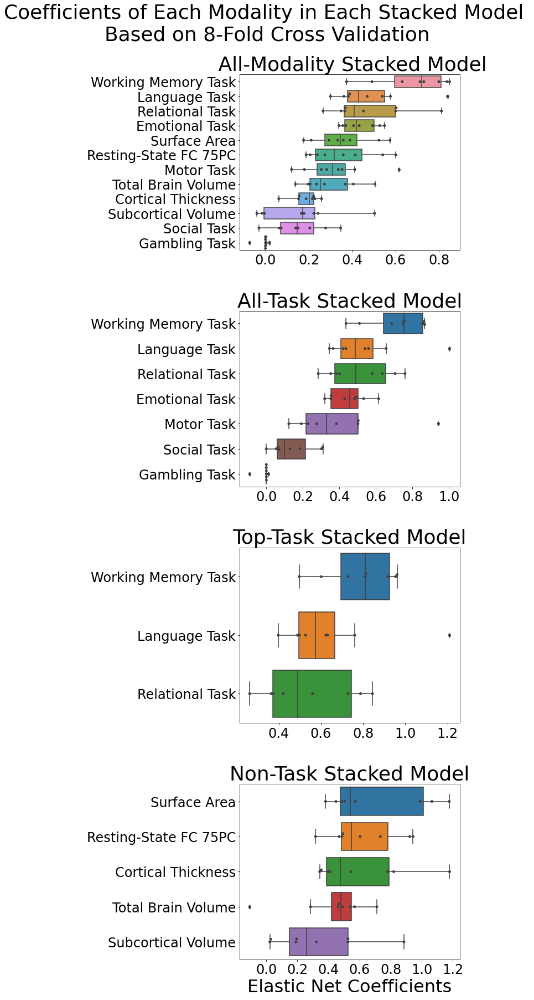

In [102]:
fig = plt.figure(figsize=(10,25))

plt.suptitle('Coefficients of Each Modality in Each Stacked Model \nBased on 8-Fold Cross Validation', fontsize=36, y=1.00)

#1
plt.subplot(4, 1, 1)

d=dct_results['all'].reindex(columns=dct_results['all'].mean().sort_values(ascending=False).index)

#plt.figure(figsize=(10,7))

sns.boxplot(data=d, orient="h")
sns.swarmplot(data=d, color=".25", orient="h")

plt.xticks(fontsize=24) #np.arange(5, 25, step=1), 
plt.yticks(fontsize=24)
plt.xlabel(' ', fontsize=32)#'Elastic Net Coefficients'
plt.ylabel(' ', fontsize=21)
#plt.title('Coefficients of Each Modality in\nthe All-Modality Stacked Model',fontsize=36)
plt.title(' All-Modality Stacked Model',fontsize=36)


#2
plt.subplot(4, 1, 2)

d=dct_results['task'].reindex(columns=dct_results['task'].mean().sort_values(ascending=False).index)

#plt.figure(figsize=(10,7))

sns.boxplot(data=d, orient="h")
sns.swarmplot(data=d, color=".25", orient="h")

plt.xticks(fontsize=24) #np.arange(5, 25, step=1), 
plt.yticks(fontsize=24)
plt.xlabel(' ', fontsize=32)
#plt.ylabel('Modalities', fontsize=21)
#plt.title('Coefficients of Each Modality in\nthe Task-Based Stacked Model',fontsize=36)
plt.title('All-Task Stacked Model',fontsize=36)


#3
plt.subplot(4, 1, 3)

d=dct_results['top-task'].reindex(columns=dct_results['top-task'].mean().sort_values(ascending=False).index)

#plt.figure(figsize=(10,7))

sns.boxplot(data=d, orient="h")
sns.swarmplot(data=d, color=".25", orient="h")

plt.xticks(fontsize=24) #np.arange(5, 25, step=1), 
plt.yticks(fontsize=24)
plt.xlabel(' ', fontsize=32)
#plt.ylabel('Modalities', fontsize=21)
#plt.title('Coefficients of Each Modality in\nthe Top-Task Based Stacked Model',fontsize=36)
plt.title('Top-Task Stacked Model',fontsize=36)


#4
plt.subplot(4, 1, 4)

d=dct_results['non-task'].reindex(columns=dct_results['non-task'].mean().sort_values(ascending=False).index)

#plt.figure(figsize=(10,7))

sns.boxplot(data=d, orient="h")
sns.swarmplot(data=d, color=".25", orient="h")

plt.xticks(fontsize=24) #np.arange(5, 25, step=1), 
plt.yticks(fontsize=24)
plt.xlabel('Elastic Net Coefficients', fontsize=32)
plt.ylabel(' ', fontsize=21)
#plt.title('Coefficients of Each Modality in\nthe Non-Task-Based Stacked Model',fontsize=36)
plt.title('Non-Task Stacked Model',fontsize=36)

fig.tight_layout(pad=1)
plt.show()

#### Single Modality Models

##### Total Brain Volume

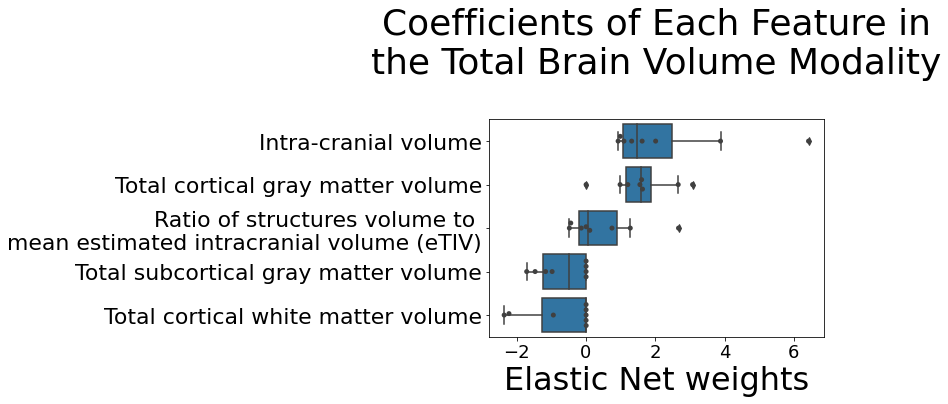

In [23]:
dct_results['VolBrain'].columns = ['Intra-cranial volume',
'Total cortical gray matter volume',
'Total subcortical gray matter volume',
'Total cortical white matter volume',
'Ratio of structures volume to \nmean estimated intracranial volume (eTIV)']

data = dct_results['VolBrain'].reindex(columns=dct_results['VolBrain'].mean().sort_values(ascending=False).index)



sns.boxplot(data=data, orient="h", color='tab:blue')
sns.swarmplot(data=data, color=".25", orient="h")

plt.xticks(fontsize=18)
plt.yticks(fontsize=22)
#plt.xlabel('', fontsize=21)
plt.xlabel('Elastic Net weights', fontsize=32)
plt.title('Coefficients of Each Feature in\nthe Total Brain Volume Modality\n',fontsize=36)

plt.show()

##### Tasks

emo


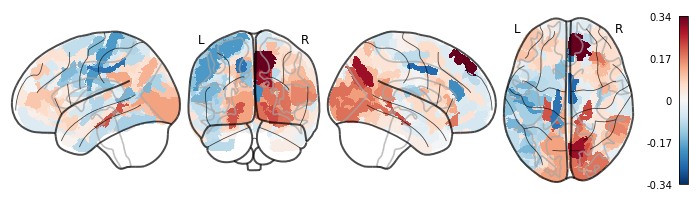

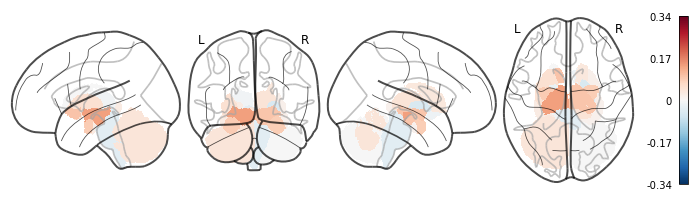

gam


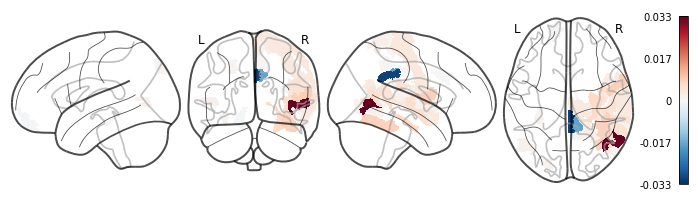

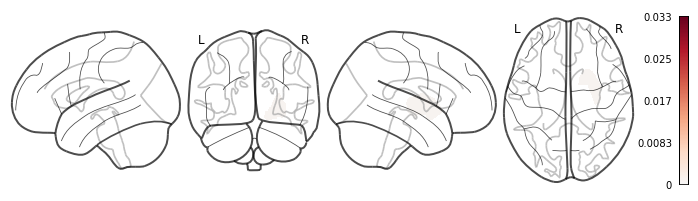

lan


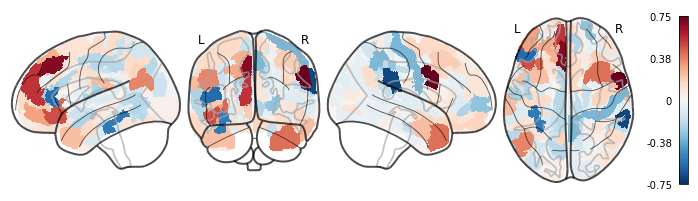

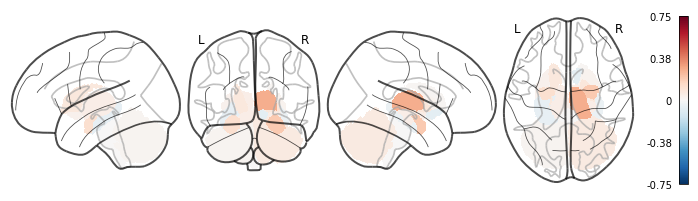

mot


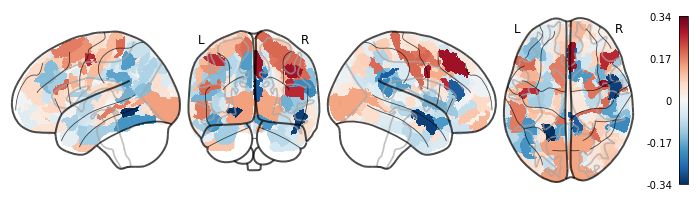

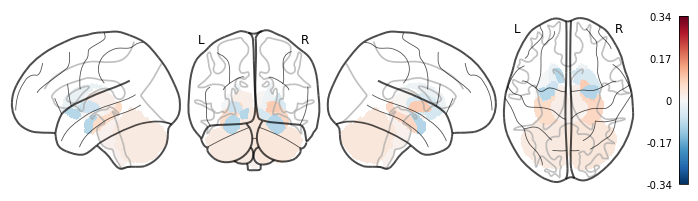

rel


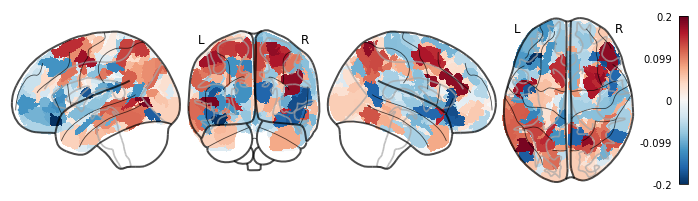

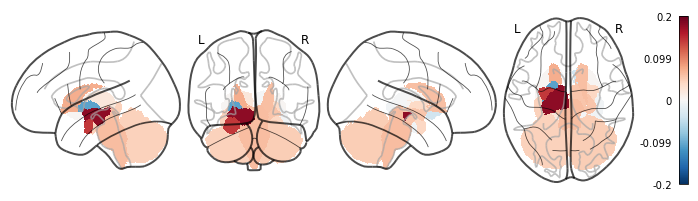

soc


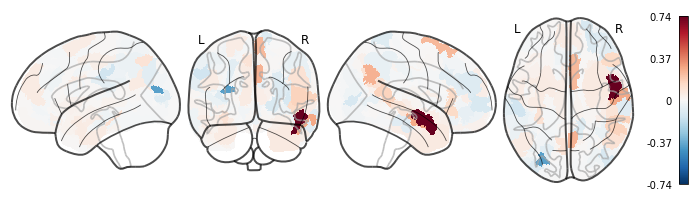

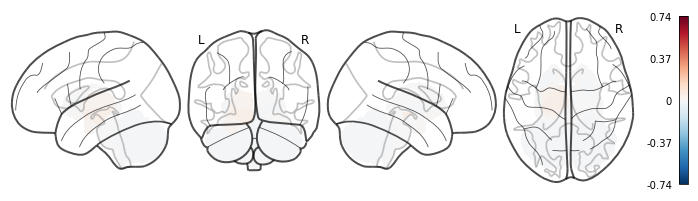

wm


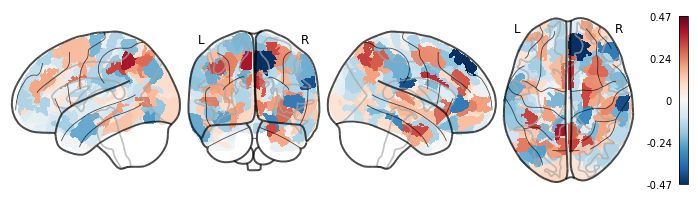

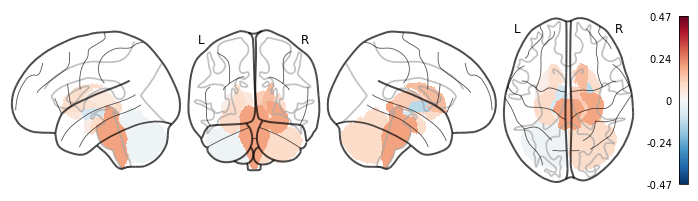

In [129]:
wway = '/media/DataD800/Alina/atlases/'

atlas = nli.load_img(wway+'MMP_in_MNI_corr.nii.gz')
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

par_dat = atlas.get_fdata()
par_dat2 = atlas2.get_fdata()

nmri = 0
sbn = 1

#fig, axes = plt.subplots(nrows=14, ncols=1)

for key in ['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm']:

    site_nii = np.zeros(par_dat.shape)
    site_nii2 = np.zeros(par_dat2.shape)
    
    data = dct_results[key].mean()
    
    #cortex according to atlas, 180:360 right hemisphere, 1:180 left. 
    vec = pd.Series(np.concatenate( [(data[180:360]).values, np.zeros(20), (data[0:180]).values]))
    #subcortex, the table has same order as atlas
    vec2 = pd.Series((data[360:]).values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )


    for index, numb in enumerate(vec): 
        site_nii[par_dat == (index+1)] = numb

    for index, numb in zip(vec2.index, vec2.iloc[:]): 
        site_nii2[par_dat2 == (index)] = numb

    site_img = nli.new_img_like(atlas, site_nii, atlas.affine, copy_header=True)

    site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
    
    print(key)
    
    ll=max(abs(min(data)), abs(max(data)))
    
    display1 =plotting.plot_glass_brain(site_img, plot_abs=False, cmap='RdBu_r', colorbar=True, display_mode='lyrz', vmin=-ll, vmax=ll)#, title=mrilist[nmri]+' cortex')
    display2 = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='RdBu_r', colorbar=True, display_mode='lyrz', vmin=-ll, vmax=ll)#, title=mrilist[nmri]+' subcortex')
    
    plotting.show()
        
    sbn+=2
    nmri+=1

In [27]:
os.mkdir(path_out+'enet_coeffs_plotting')  

In [28]:
#save each modality mean feature coefficients as vector to txt for next plotting in wb_view
for key in ['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm']:
    dct_results[key].mean()[0:360].to_csv(path_out+'enet_coeffs_plotting/mean_'+str(key)+'_cortex_gla_elnet_coeffs_nums.txt', header=None, index=None)

##### Mean tasks feature coeffs (based on Task stacked model coeffs and each single mod ML)

In [29]:
import copy
alltask_dct = {}
for key in ['wm', 'lan', 'rel', 'mot', 'emo', 'soc','gam']:
    alltask_dct[key] = dct_results[key]
df_task_ord = copy.deepcopy(dct_results['task'])
df_task_ord.columns = ['wm', 'lan', 'rel', 'mot', 'emo', 'soc','gam']
dct_mean_tasks={}
for key in df_task_ord.columns:
    dct_mean_tasks[key] = (alltask_dct[key].abs()).mean() * (df_task_ord.abs()).mean()[key]

df_mean_tasks = pd.DataFrame(dct_mean_tasks)
display(df_mean_tasks.T.mean())

R_V1_ROI          0.028116
R_MST_ROI         0.013834
R_V6_ROI          0.026437
R_V2_ROI          0.022850
R_V3_ROI          0.014538
                    ...   
PALLIDUM_RIGHT    0.034472
PUTAMEN_LEFT      0.011737
PUTAMEN_RIGHT     0.016972
THALAMUS_LEFT     0.015248
THALAMUS_RIGHT    0.037712
Length: 379, dtype: float64

In [30]:
#then calculate mean for each feature between folds and save it
df_mean_tasks.T.mean().to_csv(path_out+'enet_coeffs_tables/'+'mean_TASKS_brain_elnet_coeffs.csv')
#save only cortex for next ploting in wb_view
df_mean_tasks.T.mean()[0:360].to_csv(path_out+'enet_coeffs_plotting/'+'mean_TASKS_cortex_gla_elnet_coeffs_nums.txt', header=None, index=None)

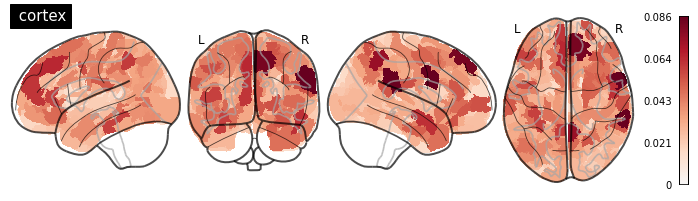

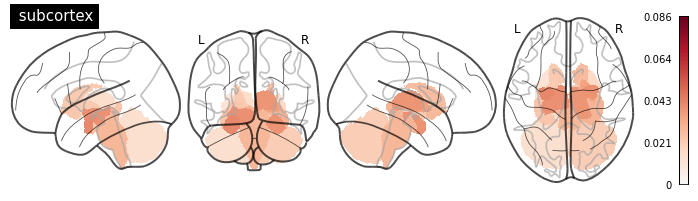

In [131]:
#plot mean feature coeff on glass_brain
wway = '/media/DataD800/Alina/atlases/'

atlas = nli.load_img(wway+'MMP_in_MNI_corr.nii.gz')
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

par_dat = atlas.get_fdata()
par_dat2 = atlas2.get_fdata()

#mrilist = lblY[:7]

#fig, axes = plt.subplots(nrows=14, ncols=1)

data = df_mean_tasks.T.mean()

site_nii = np.zeros(par_dat.shape)
site_nii2 = np.zeros(par_dat2.shape)

vec = pd.Series(np.concatenate( [(data[180:360]).values, np.zeros(20), (data[0:180]).values]))
vec2 = pd.Series((data[360:]).values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )


for index, numb in enumerate(vec): 
    site_nii[par_dat == (index+1)] = numb

for index, numb in zip(vec2.index, vec2.iloc[:]): 
    site_nii2[par_dat2 == (index)] = numb

site_img = nli.new_img_like(atlas, site_nii, atlas.affine, copy_header=True)

site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)

display1 =plotting.plot_glass_brain(site_img, plot_abs=False, cmap='RdBu_r', colorbar=True, display_mode='lyrz', 
                                    vmin=min(data), vmax=max(data), title=' cortex')
display2 = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='RdBu_r', colorbar=True, display_mode='lyrz', 
                                     vmin=min(data), vmax=max(data), title=' subcortex')

plotting.show()

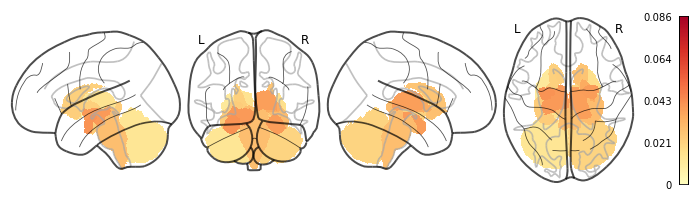

In [133]:
#plotting subcortex in different colormap
plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='RdYlGn_r', colorbar=True, display_mode='lyrz', 
                                     vmin=min(data), vmax=max(data))

In [32]:
#create cifti files for cortex brain image for glasses atlas

#read files with path
brain_files = list(glob.glob(path_out+'enet_coeffs_plotting/*_cortex_gla_elnet_coeffs_nums.*'))
#mod names
mod_brain_files = [b.split('/')[-1].split('_')[1] for b in brain_files]
#create cifti files with wb_commands
for i in range(len(brain_files)):
    cmd = 'wb_command -cifti-convert -from-text '+str(brain_files[i])+' '+wway+'glasser_cifti_empty_template.ptseries.nii' +' '+path_out+'enet_coeffs_plotting/mean_'+str(mod_brain_files[i])+'_cortex_gla_elnet_coeffs.ptseries.nii'
    os.system(cmd)
    #print(cmd)

##### Anatomical (Non-Tasks) Modalities

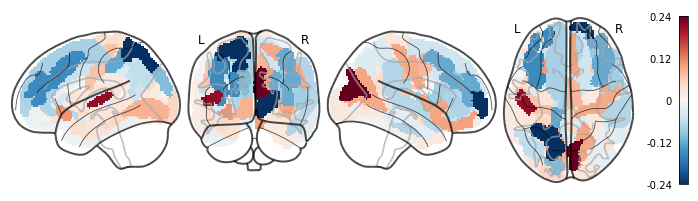

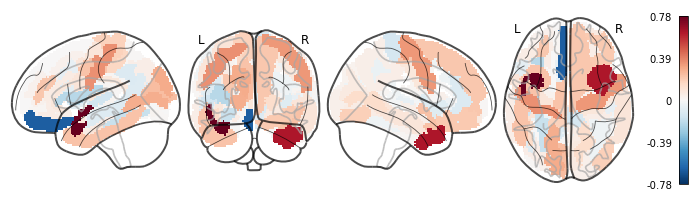

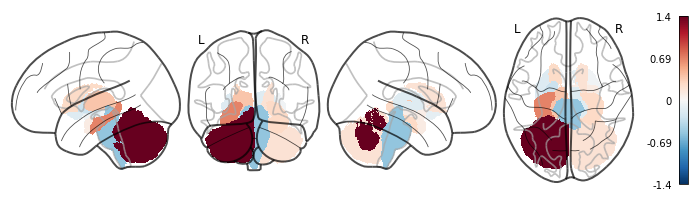

In [33]:
atlas = nli.load_img(wway+'destrieux2009_rois_lateralized.nii.gz')
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

par_dat = atlas.get_fdata()

nms = ['Cortical thickness', 'Surface area']
nn=0

for key in ['cort', 'surf']:
    
    site_nii = np.zeros(par_dat.shape)

    #add to columns the med.wall label to match with nii atlas order
    vec = dct_results[key].mean().reindex(index=np.loadtxt(wway+'destrieux2009_new_header_for_table_with_med_wall.txt',dtype=str)).fillna(0)

    for index, numb in enumerate(vec): 
        site_nii[par_dat == (index+1)] = numb

    site_img = nli.new_img_like(atlas, site_nii, atlas.affine, copy_header=True)
    
    #print(key)
    display_fs = plotting.plot_glass_brain(site_img, plot_abs=False, cmap='RdBu_r', colorbar=True, display_mode='lyrz', vmin=min(vec), vmax=max(vec))#, title=nms[nn]
    plotting.show()
    nn+=1
par_dat2 = atlas2.get_fdata()
site_nii2 = np.zeros(par_dat2.shape)

#reorder subc table into atlas order
v2 = dct_results['subc'].mean().reindex(index = ['Left-Accumbens-area',
'Right-Accumbens-area',
'Left-Amygdala',
'Right-Amygdala',
'Brain-Stem',
'Left-Caudate',
'Right-Caudate',
'Left-Cerebellum-Cortex',
'Right-Cerebellum-Cortex',
'Left-VentralDC',
'Right-VentralDC',
'Left-Hippocampus',
'Right-Hippocampus',
'Left-Pallidum',
'Right-Pallidum',
'Left-Putamen',
'Right-Putamen',
'Left-Thalamus-Proper',
'Right-Thalamus-Proper'])

vec2 =pd.Series(v2.values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )

for index, numb in zip(vec2.index, vec2.iloc[:]): 
    site_nii2[par_dat2 == (index)] = numb

site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)

#print('subc')
display_subc = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='RdBu_r', colorbar=True, display_mode='lyrz', vmin=min(vec2), vmax=max(vec2))#, title='Subcortical volume'
plotting.show()

In [115]:
#save to file in two 
for key in ['cort', 'surf']:
    vec = dct_results[key].mean().reindex(index=np.loadtxt(wway+'destrieux2009_new_header_for_table_with_med_wall.txt',dtype=str)).fillna(0)
    vec2= dct_results[key].mean()
    vec.to_csv(path_out+'enet_coeffs_plotting/mean_'+str(key)+'_cortex_struct_elnet_coeffs_nums.csv', header=None)
    vec2.to_csv(path_out+'enet_coeffs_plotting/mean2_'+str(key)+'_cortex_struct_elnet_coeffs_nums.csv', header=None, index=None)

In [119]:
# to create cifti file we need file without middle wall
for key in ['cort', 'surf']:
    cmd = 'wb_command -cifti-convert -from-text '+path_out+'enet_coeffs_plotting/mean2_'+str(key)+'_cortex_struct_elnet_coeffs_nums.csv'+' '+wway+'Destrieux_cifti_empty_template.pscalar.nii' +' '+path_out+'enet_coeffs_plotting/mean2_'+str(key)+'_cortex_DESTX_elnet_coeffs.pscalar.nii'
    os.system(cmd)
    #print(cmd)

## Resting State FC

In [35]:
dct_results['rest-pca75']

,0,1,2,3,4,5,6,7,8,9,...,65,66,67,68,69,70,71,72,73,74
Fold_0,-0.234303,-0.002561,-0.220039,0.200572,0.000000,0.000000,-0.204826,0.255459,-0.242807,-0.058358,...,-0.225251,-0.000000,-0.000000,-0.201613,-0.000000,-0.000000,0.044254,0.000000,0.000000,0.0000
Fold_1,-0.061735,0.183985,0.173871,0.031887,0.054492,0.130757,-0.216283,-0.295856,0.238925,-0.273451,...,-0.359335,0.463862,-0.299750,0.150720,0.644349,-0.239827,0.044523,-0.100248,-0.197134,-0.0924
Fold_2,-0.219838,-0.312257,-0.018946,-0.013963,-0.000000,-0.562259,-0.052409,-0.000000,0.000000,-0.898948,...,-0.255692,0.000000,0.092389,0.321190,0.000000,0.000000,0.236499,0.366151,-0.146946,-0.0000
Fold_3,-0.000000,-0.003664,0.077490,-0.057956,0.288116,-0.000000,0.438583,-0.000000,0.000000,-0.251225,...,-0.000000,0.000000,-0.009833,-0.012387,0.000000,0.103743,0.000000,0.177380,-0.000000,-0.0000
Fold_4,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.577482,0.000000,...,-0.000000,0.528514,0.000000,0.073221,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.0000
Fold_5,-0.161298,0.256260,0.002117,0.101258,0.000000,0.021588,0.039803,0.548087,-0.596171,-0.218981,...,0.000000,0.017854,0.062554,-0.000000,-0.210325,-0.000000,0.110918,0.269045,0.166611,0.0000
Fold_6,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.0000
Fold_7,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.015709,0.000000,-1.065198,-0.440250,-0.000000,...,-0.000000,-0.068053,-0.000000,-0.000000,0.134830,0.000000,0.000000,-0.000000,0.000000,-0.0000


In [36]:
dct_pca_model['Fold_0']#.keys()

,R_V1_ROI_&_R_MST_ROI,R_V1_ROI_&_R_V6_ROI,R_V1_ROI_&_R_V2_ROI,R_V1_ROI_&_R_V3_ROI,R_V1_ROI_&_R_V4_ROI,R_V1_ROI_&_R_V8_ROI,R_V1_ROI_&_R_4_ROI,R_V1_ROI_&_R_3b_ROI,R_V1_ROI_&_R_FEF_ROI,R_V1_ROI_&_R_PEF_ROI,...,PALLIDUM_RIGHT_&_PUTAMEN_LEFT,PALLIDUM_RIGHT_&_PUTAMEN_RIGHT,PALLIDUM_RIGHT_&_THALAMUS_LEFT,PALLIDUM_RIGHT_&_THALAMUS_RIGHT,PUTAMEN_LEFT_&_PUTAMEN_RIGHT,PUTAMEN_LEFT_&_THALAMUS_LEFT,PUTAMEN_LEFT_&_THALAMUS_RIGHT,PUTAMEN_RIGHT_&_THALAMUS_LEFT,PUTAMEN_RIGHT_&_THALAMUS_RIGHT,THALAMUS_LEFT_&_THALAMUS_RIGHT
0,0.005546,0.006086,0.005820,0.005409,0.005083,0.003555,-0.005608,-0.004311,-0.006328,-0.004429,...,-0.000948,-0.000176,0.000601,0.001174,0.001180,-0.001200,-0.002607,0.000105,-0.000100,0.001088
1,0.003888,0.003243,0.002792,0.003134,0.004011,0.003881,0.004937,0.006583,0.002830,0.002826,...,-0.001652,0.001169,-0.001456,-0.000996,0.001656,0.002575,-0.001651,-0.000208,-0.000829,-0.004596
2,-0.001502,0.000892,0.001675,0.001684,0.001557,0.000456,-0.000576,-0.000969,-0.002745,-0.005685,...,0.002368,-0.000041,-0.000636,-0.001424,0.003823,-0.000463,0.003300,-0.000764,-0.003502,0.000426
3,-0.005347,-0.007025,-0.006358,-0.006323,-0.005904,-0.006349,0.005869,0.006600,0.005165,0.003711,...,-0.002157,0.001651,0.000762,-0.000404,-0.000885,-0.003053,-0.002525,0.000665,0.000582,0.001327
4,-0.001967,0.002459,-0.000585,-0.001291,-0.002059,-0.002112,-0.002132,-0.000499,-0.002828,0.002822,...,-0.002432,-0.001679,-0.003115,-0.001473,-0.006496,-0.003514,-0.004501,-0.005519,-0.000252,-0.003687
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,0.000118,0.000644,0.004650,0.004440,0.002926,-0.000416,0.002482,0.002950,0.001785,-0.003707,...,0.001855,-0.003331,0.001795,0.003473,0.000417,0.000646,-0.004627,-0.004047,-0.000339,0.005820
71,0.004862,-0.001431,0.006596,0.007195,0.006305,0.001613,0.002283,0.002020,0.001304,-0.000284,...,0.001092,0.003525,-0.006879,-0.002062,0.006830,0.007115,0.003296,-0.007918,0.000051,0.005643
72,0.001753,0.001630,-0.002103,0.003146,-0.001347,0.002699,0.000759,0.001074,-0.002381,0.001447,...,0.000846,-0.002245,-0.000043,-0.001888,-0.003245,-0.008046,0.000396,0.000638,-0.002385,0.001490
73,-0.006654,-0.000133,-0.000972,-0.004610,-0.004210,-0.002592,-0.001574,-0.000495,-0.001760,-0.005285,...,-0.004207,0.007262,-0.007729,-0.009403,-0.006552,-0.006440,0.001893,0.007217,0.000832,-0.003130


In [63]:
dct_pca_transf_coefs={}
for fold in  dct_results['rest-pca75'].index:
    #the sum of 75 components which were multiplied by elnet coeffs
    dct_pca_transf_coefs[fold] = (dct_pca_model[fold].T * dct_results['rest-pca75'].loc[fold,:].abs()).T.sum()

df_pca_transf_coefs=pd.DataFrame(dct_pca_transf_coefs)

#each fold was z-scored separatelly
df_pca_transf_coefs = st.zscore(df_pca_transf_coefs, axis=1)  #zscored

df_pca_transf_coefs_folds = df_pca_transf_coefs

df_pca_transf_coefs = df_pca_transf_coefs.T.sum()

display(df_pca_transf_coefs)

R_V1_ROI_&_R_MST_ROI              2.220446e-16
R_V1_ROI_&_R_V6_ROI              -4.440892e-16
R_V1_ROI_&_R_V2_ROI               5.551115e-17
R_V1_ROI_&_R_V3_ROI              -7.632783e-17
R_V1_ROI_&_R_V4_ROI              -6.106227e-16
                                      ...     
PUTAMEN_LEFT_&_THALAMUS_LEFT      2.220446e-16
PUTAMEN_LEFT_&_THALAMUS_RIGHT     0.000000e+00
PUTAMEN_RIGHT_&_THALAMUS_LEFT     3.330669e-16
PUTAMEN_RIGHT_&_THALAMUS_RIGHT   -4.440892e-16
THALAMUS_LEFT_&_THALAMUS_RIGHT    1.554312e-15
Length: 71631, dtype: float64

###### Because of mean number are too small we have multiplied them with 1e15 for plotting

In [65]:
df_pca_transf_coefs_rescaled = (df_pca_transf_coefs*(1e15))

In [ ]:
#save tables
df_pca_transf_coefs_rescaled.to_csv(path_out+'enet_coeffs_tables/'+'rest_enet_coeffs_final_rescaled_mean.csv', header=None)
df_pca_transf_coefs_folds.to_csv(path_out+'enet_coeffs_tables/'+'rest_enet_final_coeffs_folds.csv')


<AxesSubplot:ylabel='Frequency'>

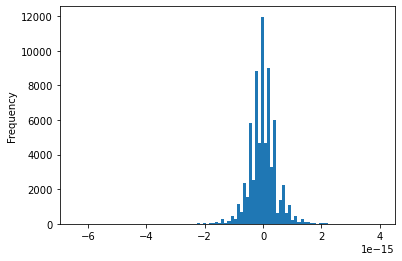

In [64]:
#plot the mean distribution 
df_pca_transf_coefs.plot(kind='hist', bins=100)

In [67]:
df_pca_transf_coefs.describe()

count    7.163100e+04
mean     7.476428e-19
std      4.612743e-16
min     -6.439294e-15
25%     -2.220446e-16
50%      0.000000e+00
75%      2.220446e-16
max      3.996803e-15
dtype: float64

In [68]:
vec = df_pca_transf_coefs_rescaled

#95%confidence interval for rescaled
CIs = st.t.interval(alpha=0.95, df=len(vec)-1, loc=np.mean(vec), scale=np.std(vec)) 
print(CIs)

(-0.9033424197276496, 0.9048377053855112)


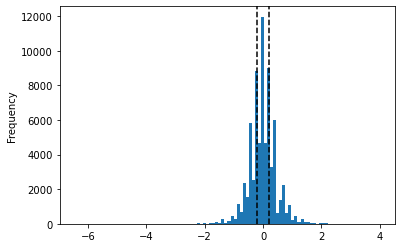

In [69]:
#plot the rescaled mean distribution 
df_pca_transf_coefs_rescaled.plot(kind='hist', bins=100)
plt.axvline(-0.197, color='black', linestyle='dashed')
plt.axvline(0.198, color='black', linestyle='dashed')
plt.show()

In [70]:
df_pca_transf_coefs_rescaled.describe()

count    71631.000000
mean         0.000748
std          0.461274
min         -6.439294
25%         -0.222045
50%          0.000000
75%          0.222045
max          3.996803
dtype: float64

In [103]:
df_pca_transf_coefs_rescaled

R_V1_ROI_&_R_MST_ROI              0.222045
R_V1_ROI_&_R_V6_ROI              -0.444089
R_V1_ROI_&_R_V2_ROI               0.055511
R_V1_ROI_&_R_V3_ROI              -0.076328
R_V1_ROI_&_R_V4_ROI              -0.610623
                                    ...   
PUTAMEN_LEFT_&_THALAMUS_LEFT      0.222045
PUTAMEN_LEFT_&_THALAMUS_RIGHT     0.000000
PUTAMEN_RIGHT_&_THALAMUS_LEFT     0.333067
PUTAMEN_RIGHT_&_THALAMUS_RIGHT   -0.444089
THALAMUS_LEFT_&_THALAMUS_RIGHT    1.554312
Length: 71631, dtype: float64

2022-05-09 16:01:08.640978


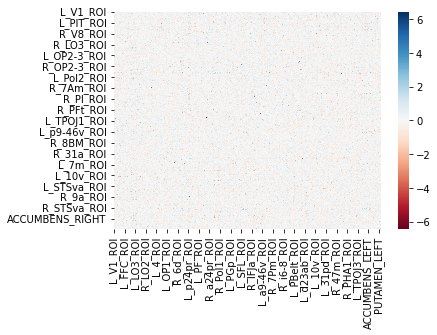

2022-05-09 16:01:21.644998


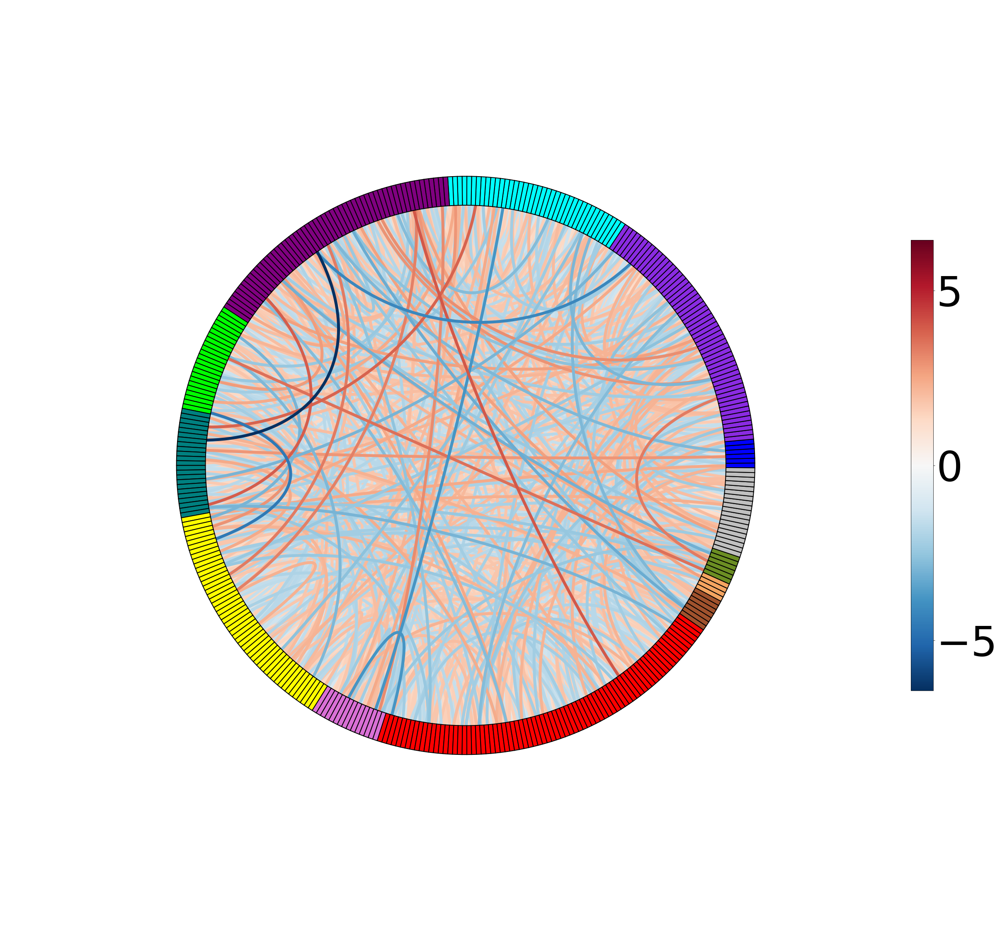

2022-05-09 16:22:46.221486


In [71]:
rest_vec=df_pca_transf_coefs_rescaled
print(datetime.now())
#reconstruct back the FC corr matrix
k=378
i = 0
matx = {}
j=0
nms=[]
while k >= 1:
    if i == 0:
        idxh = [nm.split('_&_')[1] for nm in rest_vec.index[i : i+k]]

    matx[rest_vec.index[i].split('_&_')[0]] = pd.Series(np.array(rest_vec[rest_vec.index[i : i+k]]), index=idxh[j:])
    nms+=[rest_vec.index[i].split('_&_')[0]]


    i=i+k
    k-=1
    j+=1

#assemble triu matrix from array 
rest_matx_up = pd.DataFrame(matx).reindex(index=idxh).T.fillna(0)
rest_matx_up.insert(loc=0, column='R_V1_ROI', value=np.zeros((1,len(rest_matx_up['R_MST_ROI'])))[0])
rest_matx_up = rest_matx_up.reindex(index=rest_matx_up.columns).fillna(0)

#full matrix
rest_matx = rest_matx_up + rest_matx_up.T

#load and create networks index
tbl_gla_cole = pd.read_csv(wway+'Glasser-Cole_match_table.txt')
cole_ord_fs = tbl_gla_cole.sort_values(by=['Cole_net_order', 'left_first_order'])['name_Glasser'].values
cole_ord_fs_subc = np.append(np.array(cole_ord_fs), np.array(rest_matx.columns[-19:]))

#matrix corted by networks
rest_matx_reord = rest_matx.reindex(index=cole_ord_fs_subc, columns=cole_ord_fs_subc)

cmap_edge=max(abs(np.array([rest_matx_reord.min().min(), rest_matx_reord.max().max()], dtype=float)))

#plot heatmap
sns.heatmap(rest_matx_reord, cmap="RdBu", vmin=-cmap_edge, vmax=cmap_edge)
plt.show()
print(datetime.now())

### plotting circle

node_colors = np.loadtxt(wway+'vector_cole_node_colors.txt', dtype=str)
node_names = np.array([' ' for n in range(379)], dtype=str)


plot_connectivity_circle(rest_matx_reord.values, node_names,
                         colormap='RdBu_r', facecolor='white', textcolor='black', 
                         fig=plt.figure(figsize=(50,50)), 
                         node_colors=node_colors,
                         colorbar_size=0.4, colorbar_pos=(-0.5,0.5), fontsize_colorbar=100,
                         fontsize_names=14,
                         linewidth=7, vmin=-cmap_edge, vmax=cmap_edge) 

plt.show() 
print(datetime.now())

In [72]:
import copy
df_pca_transf_coefs_rescaled2 = copy.deepcopy(df_pca_transf_coefs_rescaled)
for i in df_pca_transf_coefs_rescaled2.index:

    if CIs[0] < df_pca_transf_coefs_rescaled2.loc[i] < CIs[1]:
        df_pca_transf_coefs_rescaled2.loc[i]=0


display(df_pca_transf_coefs_rescaled2)

R_V1_ROI_&_R_MST_ROI              0.000000
R_V1_ROI_&_R_V6_ROI               0.000000
R_V1_ROI_&_R_V2_ROI               0.000000
R_V1_ROI_&_R_V3_ROI               0.000000
R_V1_ROI_&_R_V4_ROI               0.000000
                                    ...   
PUTAMEN_LEFT_&_THALAMUS_LEFT      0.000000
PUTAMEN_LEFT_&_THALAMUS_RIGHT     0.000000
PUTAMEN_RIGHT_&_THALAMUS_LEFT     0.000000
PUTAMEN_RIGHT_&_THALAMUS_RIGHT    0.000000
THALAMUS_LEFT_&_THALAMUS_RIGHT    1.554312
Length: 71631, dtype: float64

2022-05-09 16:46:27.312040


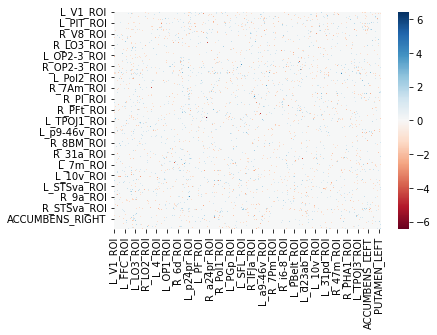

2022-05-09 16:46:27.801356


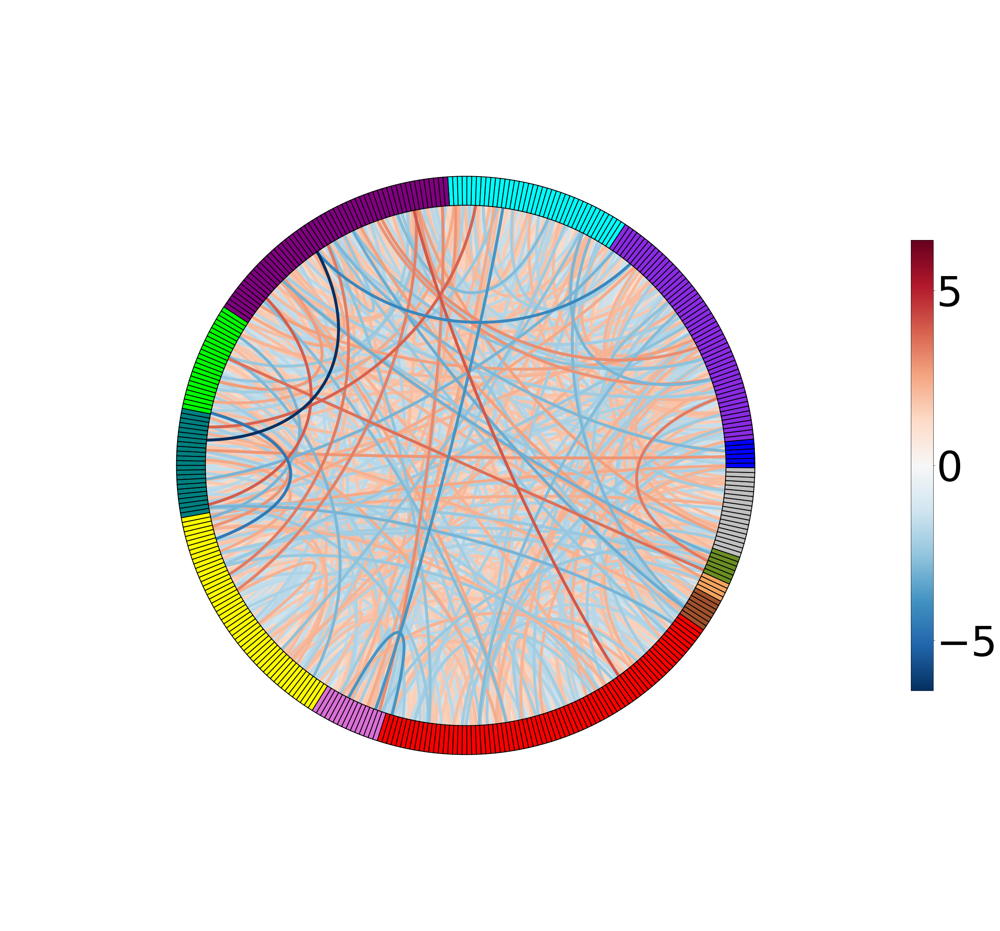

2022-05-09 17:07:39.625646


In [82]:
print(datetime.now())

rest_vec=df_pca_transf_coefs_rescaled2

#reconstruct back the FC corr matrix
k=378
i = 0
matx = {}
j=0
nms=[]
while k >= 1:
    if i == 0:
        idxh = [nm.split('_&_')[1] for nm in rest_vec.index[i : i+k]]

    matx[rest_vec.index[i].split('_&_')[0]] = pd.Series(np.array(rest_vec[rest_vec.index[i : i+k]]), index=idxh[j:])
    nms+=[rest_vec.index[i].split('_&_')[0]]


    i=i+k
    k-=1
    j+=1

#assemble triu matrix from array 
rest_matx_up = pd.DataFrame(matx).reindex(index=idxh).T.fillna(0)
rest_matx_up.insert(loc=0, column='R_V1_ROI', value=np.zeros((1,len(rest_matx_up['R_MST_ROI'])))[0])
rest_matx_up = rest_matx_up.reindex(index=rest_matx_up.columns).fillna(0)

#full matrix
rest_matx = rest_matx_up + rest_matx_up.T

#load and create networks index
tbl_gla_cole = pd.read_csv(wway+'Glasser-Cole_match_table.txt')
cole_ord_fs = tbl_gla_cole.sort_values(by=['Cole_net_order', 'left_first_order'])['name_Glasser'].values
cole_ord_fs_subc = np.append(np.array(cole_ord_fs), np.array(rest_matx.columns[-19:]))

#matrix corted by networks
rest_matx_reord = rest_matx.reindex(index=cole_ord_fs_subc, columns=cole_ord_fs_subc)

cmap_edge=max(abs(np.array([rest_matx_reord.min().min(), rest_matx_reord.max().max()], dtype=float)))

#plot heatmap
sns.heatmap(rest_matx_reord, cmap="RdBu", vmin=-cmap_edge, vmax=cmap_edge)
plt.show()

print(datetime.now())

### plotting circle

node_colors = np.loadtxt(wway+'vector_cole_node_colors.txt', dtype=str)
node_names = np.array([' ' for n in range(379)], dtype=str)


plot_connectivity_circle(rest_matx_reord.values, node_names,
                         colormap='RdBu_r', facecolor='white', textcolor='black', 
                         fig=plt.figure(figsize=(50,50)), 
                         node_colors=node_colors,
                         colorbar_size=0.4, colorbar_pos=(-0.5,0.5), fontsize_colorbar=100,
                         fontsize_names=14,
                         linewidth=7, vmin=-cmap_edge, vmax=cmap_edge) 

plt.show() 

print(datetime.now())

In [83]:
len([i for i in df_pca_transf_coefs_rescaled2 if i != 0])*100 / len(df_pca_transf_coefs_rescaled2)

4.389161117393307

In [84]:
vec = df_pca_transf_coefs_rescaled
CI99s = st.t.interval(alpha=0.99, df=len(vec)-1, loc=np.mean(vec), scale=np.std(vec))
print(CI99s)

(-1.1874396910282607, 1.1889349766861224)


In [85]:
import copy
df_pca_transf_coefs_rescaled3 = copy.deepcopy(df_pca_transf_coefs_rescaled)
for i in df_pca_transf_coefs_rescaled3.index:

    if CI99s[0] < df_pca_transf_coefs_rescaled3.loc[i] < CI99s[1]:
        df_pca_transf_coefs_rescaled3.loc[i]=0


display(df_pca_transf_coefs_rescaled3)

R_V1_ROI_&_R_MST_ROI              0.000000
R_V1_ROI_&_R_V6_ROI               0.000000
R_V1_ROI_&_R_V2_ROI               0.000000
R_V1_ROI_&_R_V3_ROI               0.000000
R_V1_ROI_&_R_V4_ROI               0.000000
                                    ...   
PUTAMEN_LEFT_&_THALAMUS_LEFT      0.000000
PUTAMEN_LEFT_&_THALAMUS_RIGHT     0.000000
PUTAMEN_RIGHT_&_THALAMUS_LEFT     0.000000
PUTAMEN_RIGHT_&_THALAMUS_RIGHT    0.000000
THALAMUS_LEFT_&_THALAMUS_RIGHT    1.554312
Length: 71631, dtype: float64

In [86]:
len([i for i in df_pca_transf_coefs_rescaled3 if i != 0])*100 / len(df_pca_transf_coefs_rescaled2)

2.170847817285812

In [87]:
len([i for i in df_pca_transf_coefs_rescaled3 if i != 0])

1555

2022-05-09 17:07:42.809214


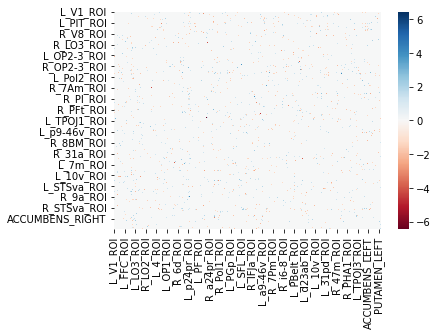

2022-05-09 17:07:43.307004


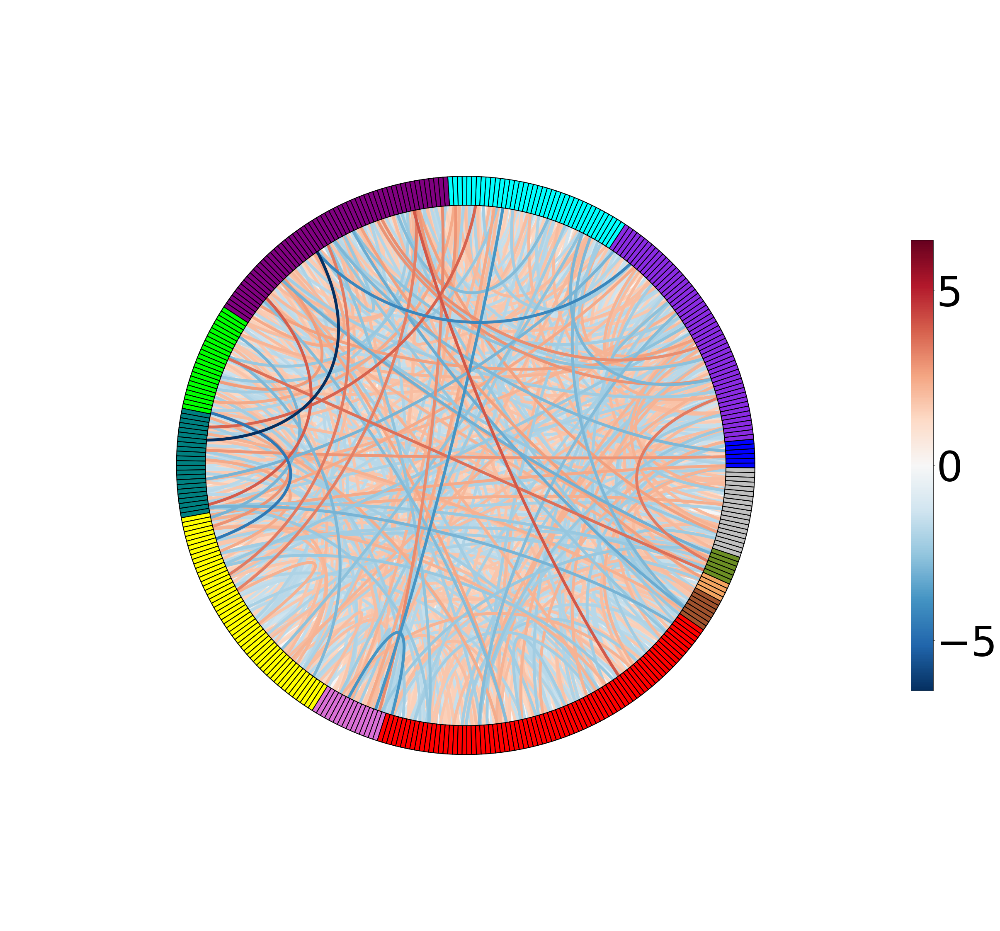

2022-05-09 17:28:50.159653


In [88]:
print(datetime.now())

rest_vec=df_pca_transf_coefs_rescaled3

#reconstruct back the FC corr matrix
k=378
i = 0
matx = {}
j=0
nms=[]
while k >= 1:
    if i == 0:
        idxh = [nm.split('_&_')[1] for nm in rest_vec.index[i : i+k]]

    matx[rest_vec.index[i].split('_&_')[0]] = pd.Series(np.array(rest_vec[rest_vec.index[i : i+k]]), index=idxh[j:])
    nms+=[rest_vec.index[i].split('_&_')[0]]


    i=i+k
    k-=1
    j+=1

#assemble triu matrix from array 
rest_matx_up = pd.DataFrame(matx).reindex(index=idxh).T.fillna(0)
rest_matx_up.insert(loc=0, column='R_V1_ROI', value=np.zeros((1,len(rest_matx_up['R_MST_ROI'])))[0])
rest_matx_up = rest_matx_up.reindex(index=rest_matx_up.columns).fillna(0)

#full matrix
rest_matx = rest_matx_up + rest_matx_up.T

#load and create networks index
tbl_gla_cole = pd.read_csv(wway+'Glasser-Cole_match_table.txt')
cole_ord_fs = tbl_gla_cole.sort_values(by=['Cole_net_order', 'left_first_order'])['name_Glasser'].values
cole_ord_fs_subc = np.append(np.array(cole_ord_fs), np.array(rest_matx.columns[-19:]))

#matrix corted by networks
rest_matx_reord = rest_matx.reindex(index=cole_ord_fs_subc, columns=cole_ord_fs_subc)

cmap_edge=max(abs(np.array([rest_matx_reord.min().min(), rest_matx_reord.max().max()], dtype=float)))

#plot heatmap
sns.heatmap(rest_matx_reord, cmap="RdBu", vmin=-cmap_edge, vmax=cmap_edge)
plt.show()

print(datetime.now())

### plotting circle

node_colors = np.loadtxt(wway+'vector_cole_node_colors.txt', dtype=str)
node_names = np.array([' ' for n in range(379)], dtype=str)


plot_connectivity_circle(rest_matx_reord.values, node_names,
                         colormap='RdBu_r', facecolor='white', textcolor='black', 
                         fig=plt.figure(figsize=(50,50)), 
                         node_colors=node_colors,
                         colorbar_size=0.4, colorbar_pos=(-0.5,0.5), fontsize_colorbar=100,
                         fontsize_names=14,
                         linewidth=7, vmin=-cmap_edge, vmax=cmap_edge) 

plt.show() 

print(datetime.now())

In [89]:
vec = df_pca_transf_coefs_rescaled
CI999s = st.t.interval(alpha=0.999, df=len(vec)-1, loc=np.mean(vec), scale=np.std(vec))
print(CI999s)

(-1.5171399720296666, 1.5186352576875426)


In [90]:
import copy
df_pca_transf_coefs_rescaled4 = copy.deepcopy(df_pca_transf_coefs_rescaled)
for i in df_pca_transf_coefs_rescaled4.index:

    if CI999s[0] < df_pca_transf_coefs_rescaled4.loc[i] < CI999s[1]:
        df_pca_transf_coefs_rescaled4.loc[i]=0


display(df_pca_transf_coefs_rescaled4)

R_V1_ROI_&_R_MST_ROI              0.000000
R_V1_ROI_&_R_V6_ROI               0.000000
R_V1_ROI_&_R_V2_ROI               0.000000
R_V1_ROI_&_R_V3_ROI               0.000000
R_V1_ROI_&_R_V4_ROI               0.000000
                                    ...   
PUTAMEN_LEFT_&_THALAMUS_LEFT      0.000000
PUTAMEN_LEFT_&_THALAMUS_RIGHT     0.000000
PUTAMEN_RIGHT_&_THALAMUS_LEFT     0.000000
PUTAMEN_RIGHT_&_THALAMUS_RIGHT    0.000000
THALAMUS_LEFT_&_THALAMUS_RIGHT    1.554312
Length: 71631, dtype: float64

In [91]:
len([i for i in df_pca_transf_coefs_rescaled4 if i != 0])*100 / len(df_pca_transf_coefs_rescaled2)

0.8697351705267272

In [92]:
len([i for i in df_pca_transf_coefs_rescaled4 if i != 0])

623

2022-05-09 17:28:53.300720


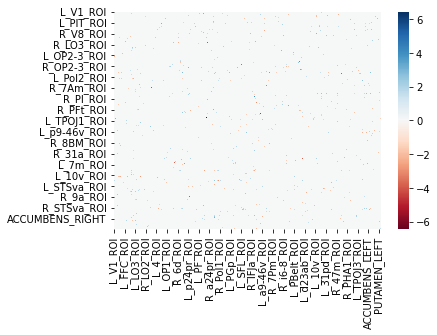

2022-05-09 17:28:53.796476


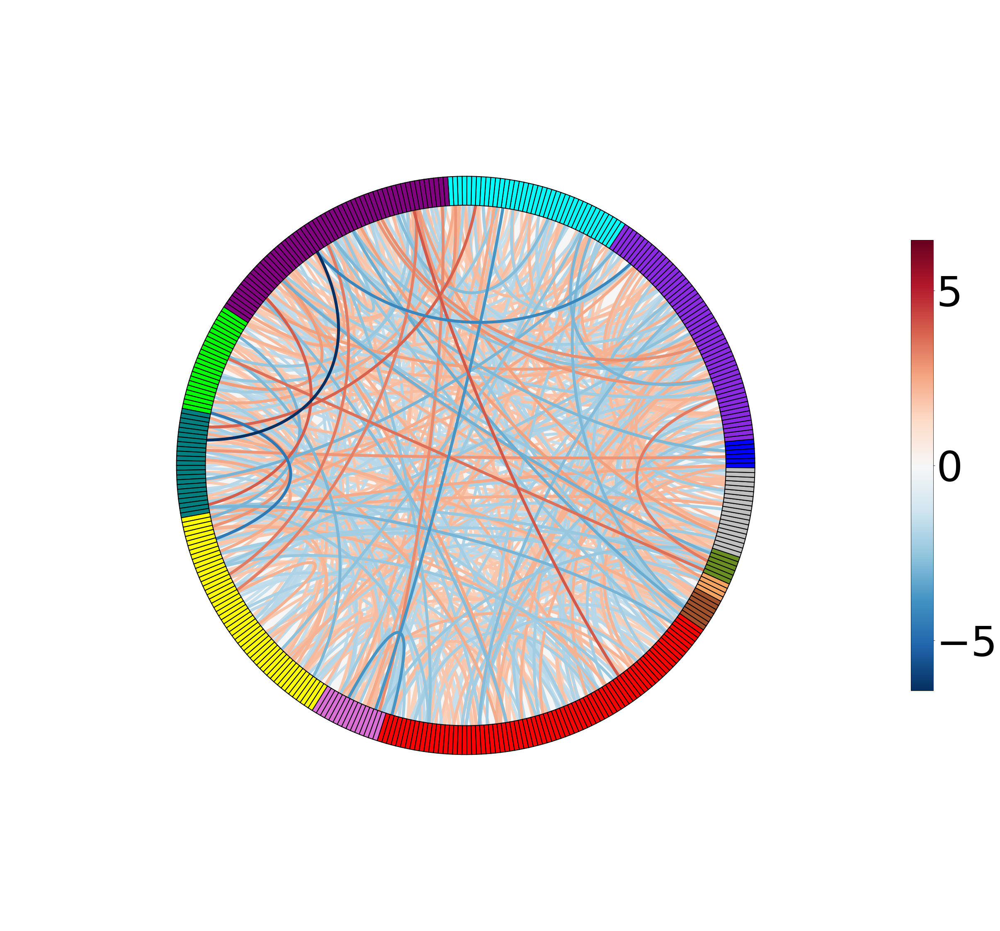

2022-05-09 17:49:58.457712


In [93]:
print(datetime.now())

rest_vec=df_pca_transf_coefs_rescaled4

#reconstruct back the FC corr matrix
k=378
i = 0
matx = {}
j=0
nms=[]
while k >= 1:
    if i == 0:
        idxh = [nm.split('_&_')[1] for nm in rest_vec.index[i : i+k]]

    matx[rest_vec.index[i].split('_&_')[0]] = pd.Series(np.array(rest_vec[rest_vec.index[i : i+k]]), index=idxh[j:])
    nms+=[rest_vec.index[i].split('_&_')[0]]


    i=i+k
    k-=1
    j+=1

#assemble triu matrix from array 
rest_matx_up = pd.DataFrame(matx).reindex(index=idxh).T.fillna(0)
rest_matx_up.insert(loc=0, column='R_V1_ROI', value=np.zeros((1,len(rest_matx_up['R_MST_ROI'])))[0])
rest_matx_up = rest_matx_up.reindex(index=rest_matx_up.columns).fillna(0)

#full matrix
rest_matx = rest_matx_up + rest_matx_up.T

#load and create networks index
tbl_gla_cole = pd.read_csv(wway+'Glasser-Cole_match_table.txt')
cole_ord_fs = tbl_gla_cole.sort_values(by=['Cole_net_order', 'left_first_order'])['name_Glasser'].values
cole_ord_fs_subc = np.append(np.array(cole_ord_fs), np.array(rest_matx.columns[-19:]))

#matrix corted by networks
rest_matx_reord = rest_matx.reindex(index=cole_ord_fs_subc, columns=cole_ord_fs_subc)

cmap_edge=max(abs(np.array([rest_matx_reord.min().min(), rest_matx_reord.max().max()], dtype=float)))

#plot heatmap
sns.heatmap(rest_matx_reord, cmap="RdBu", vmin=-cmap_edge, vmax=cmap_edge)
plt.show()

print(datetime.now())

### plotting circle

node_colors = np.loadtxt(wway+'vector_cole_node_colors.txt', dtype=str)
node_names = np.array([' ' for n in range(379)], dtype=str)


plot_connectivity_circle(rest_matx_reord.values, node_names,
                         colormap='RdBu_r', facecolor='white', textcolor='black', 
                         fig=plt.figure(figsize=(50,50)), 
                         node_colors=node_colors,
                         colorbar_size=0.4, colorbar_pos=(-0.5,0.5), fontsize_colorbar=100,
                         fontsize_names=14,
                         linewidth=7, vmin=-cmap_edge, vmax=cmap_edge) 

plt.show() 

print(datetime.now())